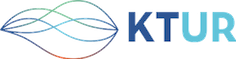

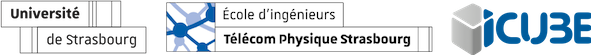

In [ ]:
!pip uninstall tensorflow -y
!pip install tensorflow==2.14

# Classification of image data - Cats and Dogs dataset

The task will be to build a neural network that will classify images into cats and dogs.

## Loading data

Cats and dogs dataset can be downloaded with *tensorflow_datasets* library.

In [2]:
import tensorflow_datasets as tfds
setattr(tfds.image_classification.cats_vs_dogs, '_URL',"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")

Download a dataset. Split the dataset into train, validation and test set.

In [3]:
split = ['train[:60%]', 'train[60%:80%]', 'train[80%:]']
trainDataset, valDataset, testDataset = tfds.load(name='cats_vs_dogs', split=split, as_supervised=True)

Dataset object contains both input images and ground truth. "None" in shapes means that the dimension is unknown, the reason here is that different images can have different sizes. The data in these datasets are given in the form of Tensors which are the basic data structures used in TensorFlow.

In [4]:
trainDataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

Show several images and their labels from the dataset

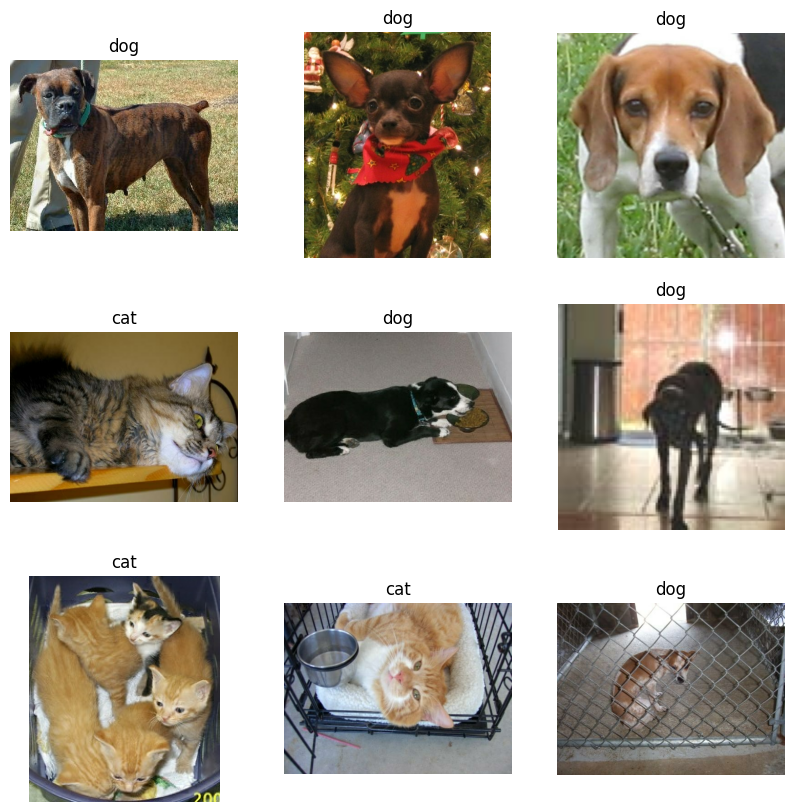

In [5]:
import matplotlib.pyplot as plt

classNames = ['cat', 'dog']

plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(trainDataset.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(classNames[label])
    plt.axis("off")

Images in the dataset are of different sizes.

In [6]:
for img, gt in trainDataset.take(4):
  print(img.shape)

(262, 350, 3)
(409, 336, 3)
(493, 500, 3)
(375, 500, 3)


Pixel values are integers from 0 to 255 which is not convenient for the training.

In [7]:
for img, gt in trainDataset.take(1):
  print(img)

tf.Tensor(
[[[251 255 255]
  [248 254 252]
  [242 246 245]
  ...
  [188 176 128]
  [142 132  81]
  [160 150  99]]

 [[247 253 251]
  [246 252 250]
  [241 245 244]
  ...
  [188 178 129]
  [164 154 103]
  [176 166 115]]

 [[244 249 245]
  [244 249 245]
  [236 241 237]
  ...
  [197 187 138]
  [203 193 142]
  [198 191 139]]

 ...

 [[127 124  73]
  [149 146  95]
  [155 152 101]
  ...
  [165 170 140]
  [ 81  88  57]
  [ 75  84  53]]

 [[167 164 113]
  [104 101  50]
  [139 136  85]
  ...
  [ 67  73  45]
  [ 48  57  28]
  [ 38  49  19]]

 [[135 132  81]
  [ 77  74  23]
  [135 132  81]
  ...
  [ 61  70  41]
  [ 12  21   0]
  [ 64  75  45]]], shape=(262, 350, 3), dtype=uint8)


Ground truth - 0 for cat, 1 for dog

In [8]:
for img, gt in trainDataset.take(4):
  print(gt)

tf.Tensor(1, shape=(), dtype=int64)
tf.Tensor(1, shape=(), dtype=int64)
tf.Tensor(1, shape=(), dtype=int64)
tf.Tensor(0, shape=(), dtype=int64)


Preprocess dataset. Resize all the images to 150x150. Scale pixel values to between 0 and 1. The transformations on the TensorFlow datasets are done by mapping the functions that will be executed on each sample of the dataset. Since the data is in the form of tensors, we should use TensorFlow operations on them, and not Python and NumPy operations. (There are ways though to transform Numpy operations to TensorFlow ones, but this is not very efficient). Basic operations like addition, subtraction, division etc. are internally transformed to tensor operations.

In [9]:
import tensorflow as tf

HEIGHT = 150
WIDTH = 150

def preprocess(img, label):
    img = tf.image.resize(img, [HEIGHT, WIDTH]) / 255
    return img, label

trainDataset = trainDataset.map(preprocess)
valDataset = valDataset.map(preprocess)
testDataset = testDataset.map(preprocess)

When using TensorFlow datasets, batch size is set on the level of dataset, and not when fitting the model. Set a batch size 32 for all the datasets.

In [10]:
trainDataset = trainDataset.batch(32)
valDataset = valDataset.batch(32)
testDataset = testDataset.batch(32)

## Fully-connected network for classifying cats and dogs

We will create a fully-connected network to classify between cats and dogs.

Imports

In [11]:
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

Create the model

In [12]:
model = Sequential()

TODO - Add input layer and specify the shape.

In [13]:
# TODO - Add your code here
model.add(Input(shape=(HEIGHT, WIDTH, 3)))

TODO - Images are 3D matrices, but for fully connected network we need vectors. Flatten the input.

In [14]:
# TODO - Add your code here
model.add(Flatten())

TODO - Add 4 hidden layers with ReLU activations and with 512, 64, 32, and 16 neurons respectively. Add the output layer that has 1 neuron and a sigmoid. Compile the model (adam, binary crossentropy, binary accuracy).

In [15]:
# TODO - Add your code here
model.add(Dense(512, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

model.summary()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 67500)             0         
                                                                 
 dense (Dense)               (None, 512)               34560512  
                                                                 
 dense_1 (Dense)             (None, 64)                32832     
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 16)                528       
                                                                 
 dense_4 (Dense)             (None, 1)                 17        
                                                                 
Total params: 34595969 (131.97 MB)
Trainable params: 345

Tensorboard callback

In [16]:
tb = TensorBoard(histogram_freq=1)

Load the TensorBoard

In [17]:
%reload_ext tensorboard

We will save the best model. Mount Google Drive.

In [18]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Choose the folder to which you will save the model.

In [19]:
path = F"/content/gdrive/My Drive/models/MLP_Cats_Dogs"

Now we are creating the callback that will check the validation loss after each epoch and save only the best model.

In [20]:
save_callback = ModelCheckpoint(
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                # The saved model name will include the current epoch.
                filepath=path,
                save_best_only=True,  # Only save a model if `val_loss` has improved.
                monitor="val_loss",
                verbose=1,
            )

TODO - Train the model for 5 epochs on train dataset. Validate the results after each epoch on validation dataset. Pass callbacks for TensorBoard and for saving the best model.

In [21]:
# TODO - Add your code here
model.fit(trainDataset, epochs=5, validation_data=valDataset, verbose=1, callbacks=[tb, save_callback])

Epoch 1/5
437/437 [==============================] - ETA: 0s - loss: 0.8848 - binary_accuracy: 0.5518
Epoch 1: val_loss improved from inf to 0.67958, saving model to /content/gdrive/My Drive/models/MLP_Cats_Dogs
437/437 [==============================] - 317s 718ms/step - loss: 0.8848 - binary_accuracy: 0.5518 - val_loss: 0.6796 - val_binary_accuracy: 0.5811
Epoch 2/5
437/437 [==============================] - ETA: 0s - loss: 0.7567 - binary_accuracy: 0.5698
Epoch 2: val_loss improved from 0.67958 to 0.67785, saving model to /content/gdrive/My Drive/models/MLP_Cats_Dogs
437/437 [==============================] - 311s 710ms/step - loss: 0.7567 - binary_accuracy: 0.5698 - val_loss: 0.6779 - val_binary_accuracy: 0.5820
Epoch 3/5
437/437 [==============================] - ETA: 0s - loss: 0.6915 - binary_accuracy: 0.5778
Epoch 3: val_loss improved from 0.67785 to 0.66349, saving model to /content/gdrive/My Drive/models/MLP_Cats_Dogs
437/437 [==============================] - 317s 724ms/step

Run TensorBoard

In [22]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

Load the weights of the best model

In [23]:
model.load_weights(path)

TODO - Evaluate the model on the test dataset.

In [24]:
# TODO - Add your code here
model.evaluate(testDataset)

146/146 [==============================] - 15s 101ms/step - loss: 0.6589 - binary_accuracy: 0.6135


[0.6588654518127441, 0.6134995818138123]

Visualise the results.

1/1 [==============================] - 0s 249ms/step


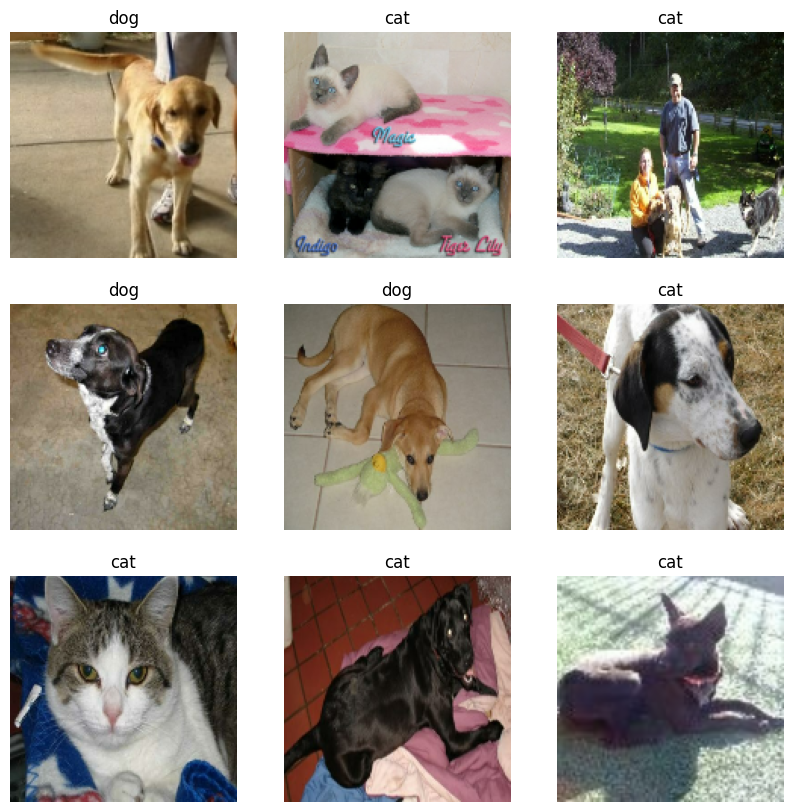

In [25]:
import numpy as np

def display_results():
  test_ds_1_batch = testDataset.take(1)
  y_pred_1_batch = (model.predict(test_ds_1_batch)>0.5).astype(np.uint8).transpose()[0]

  plt.figure(figsize=(10, 10))
  for img_batch, _ in testDataset.take(1):
    img_batch_arr = img_batch.numpy()
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(img_batch_arr[i])
      plt.title(classNames[y_pred_1_batch[i]])
      plt.axis("off")

display_results()

In [26]:
del model
tf.keras.backend.clear_session()

## Convolutional network for classifying cats and dogs

We will now make a convolutinal neural network for classifying between cats and dogs images.

Imports

In [27]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D

TODO - Create a convolutional neural network which contains 3 convolutional layers, each with 3x3 kernel size and ReLU activation, each followed by max-pooling layer of pool size 2, and with 16, 32, and 64 filters respectivelly. Convolutional layers should be followed by a dense layer with 512 neurons (ReLu activation again), and an output layer with 1 neuron (sigmoid activation). Compiling should be done as usual for binary classification.

In [28]:
# TODO - Add your code here
model = Sequential([
    Input(shape=(HEIGHT, WIDTH, 3)),
    Conv2D(16, (3, 3), activation='relu', input_shape=(HEIGHT, WIDTH, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')
])
model.summary()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 64)        0

Note that this convolutional model has a lot less parameteres than the fully-connected one.

TensorBoard

In [29]:
# prepare callback
tb = TensorBoard(histogram_freq=1)

In [30]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard

Choose the folder to which you will save the model.

In [31]:
path = F"/content/gdrive/My Drive/models/CNN_Cats_Dogs"

Creating the callback to save the best model.

In [32]:
save_callback = ModelCheckpoint(
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                # The saved model name will include the current epoch.
                filepath=path,
                save_best_only=True,  # Only save a model if `val_loss` has improved.
                monitor="val_loss",
                verbose=1,
            )

TODO - Train the model for 5 epochs on train dataset. Validate the results after each epoch on validation dataset. Pass callbacks for TensorBoard and for saving the best model.

In [33]:
# TODO - Add your code here
model.fit(trainDataset, epochs=5, validation_data=valDataset, verbose=1, callbacks=[tb, save_callback])

Epoch 1/5
437/437 [==============================] - ETA: 0s - loss: 0.6303 - binary_accuracy: 0.6449
Epoch 1: val_loss improved from inf to 0.55402, saving model to /content/gdrive/My Drive/models/CNN_Cats_Dogs
437/437 [==============================] - 363s 827ms/step - loss: 0.6303 - binary_accuracy: 0.6449 - val_loss: 0.5540 - val_binary_accuracy: 0.7159
Epoch 2/5
437/437 [==============================] - ETA: 0s - loss: 0.5014 - binary_accuracy: 0.7555
Epoch 2: val_loss improved from 0.55402 to 0.49941, saving model to /content/gdrive/My Drive/models/CNN_Cats_Dogs
437/437 [==============================] - 357s 817ms/step - loss: 0.5014 - binary_accuracy: 0.7555 - val_loss: 0.4994 - val_binary_accuracy: 0.7569
Epoch 3/5
437/437 [==============================] - ETA: 0s - loss: 0.4215 - binary_accuracy: 0.8048
Epoch 3: val_loss improved from 0.49941 to 0.49587, saving model to /content/gdrive/My Drive/models/CNN_Cats_Dogs
437/437 [==============================] - 342s 783ms/step

Run TensorBoard

In [34]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 11130), started 0:30:02 ago. (Use '!kill 11130' to kill it.)

<IPython.core.display.Javascript object>

Load the weights of the best model

In [35]:
model.load_weights(path)

TODO - Evaluate the model on the test dataset.

In [36]:
# TODO - Add your code here
model.evaluate(testDataset)

146/146 [==============================] - 28s 190ms/step - loss: 0.4842 - binary_accuracy: 0.7749


[0.4842108488082886, 0.7749354839324951]

Visualise the results.

1/1 [==============================] - 1s 507ms/step


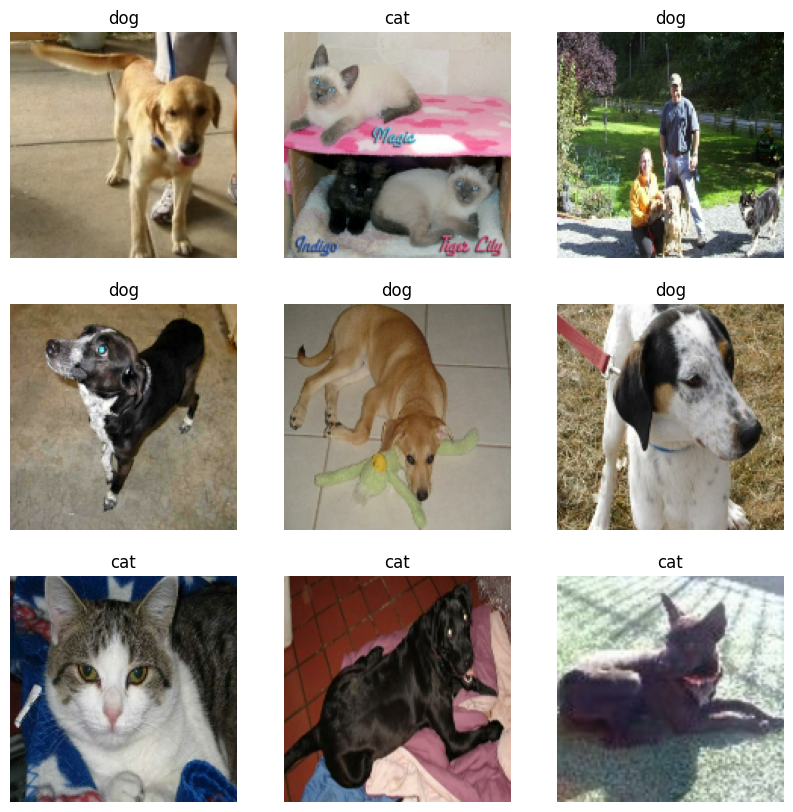

In [37]:
display_results()